#Lab 5: FIR Filtering 2

The goal of this lab is to study the response of FIR filters to inputs such as complex exponentials and sinusoids. In the experiments of this lab, you will use `np.convolve()` to implement filters and `freqz()` to obtain the filter’s frequency response. As a result, you should learn how to characterize a filter by knowing how it reacts to different frequency components in the input.
This lab also introduces two practical filters: bandpass filters and nulling filters.
Bandpass filters can be used to detect and extract information from sinusoidal signals,
e.g., tones in a touch-tone telephone dialer. Nulling filters can be used to remove
sinusoidal interference, e.g., jamming signals in a radar.

In [ ]:
!git clone https://github.com/pzinemanas/sis1lab.git

import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from sis1lab.util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram

Cloning into 'sis1lab'...
remote: Enumerating objects: 59, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 59 (delta 16), reused 28 (delta 6), pack-reused 0
Unpacking objects: 100% (59/59), done.


1.1. First, let's replicate what we did until now. Copy the functions synthesize and envelope and obtain the synthesis from the last lab.

In [ ]:
def envelope(x, N):
  y = np.convolve(np.abs(x), [1/N]*N, 'same')
  return y

def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, len(Ak) + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

filepath = "./sis1lab/audio/reference.wav"
x, fs = load_audio(filepath)

env = envelope(x, 200)
Ts = 1/float(fs)
t = np.arange(0, len(env)*Ts, Ts)
weights = [1, 0.16, 0.093, 0.15, 0.05, 0.06, 0.013, 0.009, 0.02, 0.02, 0.011, 0.0054, 0.0026]

y = synthesize(196, 0, weights, t)

y = y*env
y = np.amax(x)*y/np.amax(y)

In [ ]:
plot_signals([y, env], fs, t_start=0, t_end=0.5, name=['reference', 'envelope'])
plot_signals([x, y], fs, t_start=0, t_end=1.5, name=['reference', 'synthetized'])

ipd.Audio(y, rate=fs)

---

**2. Average filter**

Now let's analyze the frequency response of the average filter used in the envelope function. The Scipy Python module has a function called *freqz()* for computing the frequency
response of a discrete-time LTI system. The following Python statements show how to
use freqz to compute and plot both the magnitude (absolute value) and the phase of
the frequency response of a four-point averaging system as a function of ω in the range − π ≤ ω ≤ π :

In [ ]:
from sis1lab.util import plot_frequency_response

ww = np.arange(-np.pi, np.pi, np.pi/500)
_, HH = signal.freqz([1/4]*4, 1, ww)

plot_frequency_response(ww, HH)

The graph is a frequency response plot of a digital filter. The top section shows the magnitude response, represented by a blue line that peaks at 1 and dips to -1, indicating how the filter alters the amplitude of the input signal. The bottom section shows the phase response, represented by a jagged red line, indicating the phase shift introduced by the filter. The x-axis represents the normalized radian frequency.



For FIR filters, the second argument of `freqz(-, 1,- )` must always be equal to 1. The frequency vector ww should cover an interval of length 2π for ω , and its spacing must be fine enough to give a smooth curve for H(ejω) . Note: we will always use capital H for the frequency response.

2.1 Use the `freqz` and `plot_frequency_response` functions to plot the frequency response of the averaging filter of your envelope function.



In [ ]:
ww = np.arange(-np.pi, np.pi, np.pi/500)
N = 300
_, HH = signal.freqz([1/N]*N, 1, ww)

plot_frequency_response(ww, HH)

2.2 Looking at the frequency responses, what are the main differences between your filter and the four-point averaging filter. What happens when the value N is increased?

The size of the filter (N) determines the degree of smoothing.

The four-point averaging filter has a smaller size (N=4), which means it averages over fewer points. This results in less smoothing.

The frequency response of an averaging filter is essentially a sinc function. The main lobe width in the frequency domain is inversely proportional to N. So, a larger N (like 300) will result in a narrower main lobe compared to a smaller N (like 4). This means that the filter will have a sharper cutoff frequency.

As N increases, the transition in the frequency response becomes sharper, and the pass-band and stop-band become flatter3. This leads to better amplitude preservation or attenuation. However, increasing N can also lead to more issues with filter stability3. In the time domain, higher order filters (larger N) tend to make the response more wavy.

---

**3. Nulling Filters for Rejection**

Nulling filters are filters that completely eliminate some frequency components. If the frequency is $\omega=0$ or $\omega=\pi$ then a two-point FIR filter will do the nulling. The simplest possible general nulling filter can have as few as three coefficients. If $\omega_n$ is the desired nulling frequency, then the following length-3 FIR filter

$$
y[n] = x[n] - 2\cos(\omega_n)x[n-1] + x[n-2]
$$

will have a zero in its frequency response at $\omega=\omega_n$. For example, a filter designed to completely eliminate signals of the form $e^{j0.5\pi}$ would have the following coefficients because we would pick the desired nulling frequency to be $\omega_n = 0.5\pi$

$$
b_0 = 1, \quad b1=-2cos(\omega_n)=0, \quad b_2=1
$$

3.1 Use the following function to add an interference in your reference signal. Name the corrupted signal as `x_interf`.

In [ ]:
def add_interference(x, fs):
  t = np.linspace(0, len(x)*1/float(fs), len(x))
  y = x + (np.amax(x)/10)*np.sin(2*np.pi*1000*t)
  return y

In [ ]:
x_interf = add_interference(x, fs)

3.2 Plot both the reference signal and the corrupted signal and listen to the latter one.

In [ ]:
plot_signals([x, x_interf], fs, t_start=0, t_end=0.5, name=['original', 'original+interference'])
ipd.Audio(x_interf, rate=fs)

3.3 Compare the spectrograms of the reference signal and the interference signal.

(800.0, 1200.0)

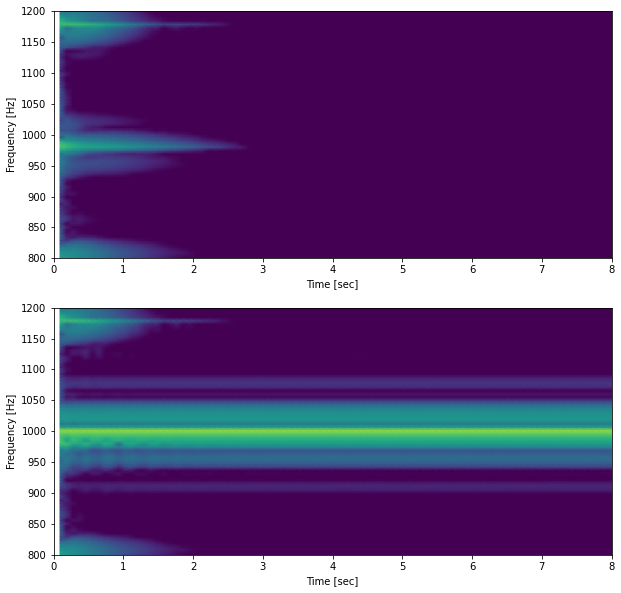

In [ ]:
hop_length = 4096
n_fft = 8192

ff, tt, S = signal.spectrogram(x, fs, nperseg=n_fft, noverlap=hop_length, nfft=n_fft)
ff, tt, Sy = signal.spectrogram(x_interf, fs, nperseg=n_fft, noverlap=hop_length, nfft=n_fft)

plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plot_spectrogram(ff, tt, S)
plt.xlim([0,8])
plt.ylim([800,1200])
plt.subplot(2,1,2)
plot_spectrogram(ff, tt, Sy)
plt.xlim([0,8])
plt.ylim([800,1200])

The interference is a sine wave with a frequency of 1000 Hz. The amplitude of the sine wave is 1/10th of the maximum amplitude in the original signal x. This interference is added to the original signal x to create the interfered signal y.

When we generate the spectrograms for the original signal x and the interfered signal y, we see a noticeable difference at the 1000 Hz frequency component. The spectrogram of y  hows a stronger presence at 1000 Hz compared to the spectrogram of x, reflecting the added interference.

3.4. Create a function `remove_interference(x, fs)` that applies a nulling filter devised to remove the interference at 1000 Hz.

Note: remember that a frequency can be converted to the normalized radian frequncy by: $\omega_n = 2\pi f_n/f_s$

In [ ]:
def remove_interference(x, fs):
  f = 1000
  wn = 2*np.pi*f/fs
  y = np.convolve(x, [1, -2*np.cos(wn), 1], 'same')
  y = np.amax(x)*y/np.amax(y)
  return y

3.5 Use the `remove_interference` funcion to clean the corrupted signal,  `x_interf`. Call the output as `x_clean`. Compare the spectrograms of both signals. Explain the result.

(0.0, 4000.0)

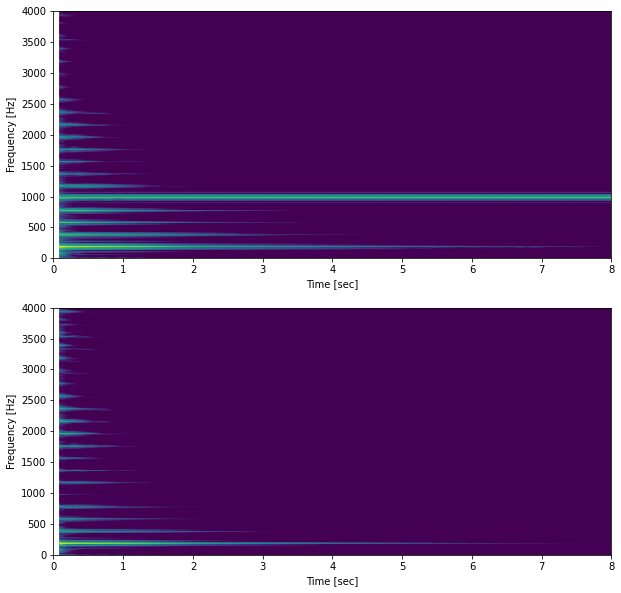

In [ ]:
hop_length = 4096
n_fft = 8192
x_clean = remove_interference(x_interf, fs)
ff, tt, S = signal.spectrogram(x_interf, fs, nperseg=n_fft, noverlap=hop_length, nfft=n_fft)
ff, tt, Sy = signal.spectrogram(x_clean, fs, nperseg=n_fft, noverlap=hop_length, nfft=n_fft)

plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plot_spectrogram(ff, tt, S)
plt.xlim([0,8])
plt.ylim([0,4000])
plt.subplot(2,1,2)
plot_spectrogram(ff, tt, Sy)
plt.xlim([0,8])
plt.ylim([0,4000])

In [ ]:
ipd.Audio(x_clean, rate=fs)

This function applies a notch filter to the signal x to remove the interference at a frequency of 1000 Hz. The notch filter is implemented by convolving x with the sequence $[1, -2*cos(wn), 1]$, where $wn$ is the angular frequency of the interference. After applying the notch filter, the function normalizes the amplitude of the cleaned signal y to match the amplitude of the original signal x.

By comparing these two spectrograms, you can see the effect of the remove_interference function. If the function has successfully removed the interference, the spectrogram of x_clean should show a reduced presence at 1000 Hz compared to the spectrogram of x_interf. This would indicate that the interference has been effectively removed from the signal.

